# Clustering

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.cluster import DBSCAN




In [2]:
dry_bean_df = pd.read_excel('/Users/patrickpetter/Desktop/pacemaker_dev/clients/shannon_assignment/data_input/Dry_Bean_Dataset.xlsx')

In [3]:
dry_bean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [4]:
dry_bean_df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


# Summary of Findings

- **Area and ConvexArea**: Both have high mean values (53,048.28 and 53,768.20 pixels, respectively) with large standard deviations (~29,000 pixels), indicating significant variability in bean sizes.
- **Perimeter**: The mean perimeter is 855.28 with a standard deviation of 214.29, suggesting considerable variation in bean circumferences.
- **MajorAxisLength and MinorAxisLength**: The mean values are 320.14 and 202.27, respectively, with notable variability, reflecting diverse bean shapes and sizes.
- **AspectRatio**: The mean aspect ratio is 1.58, with a smaller standard deviation of 0.25, indicating less variability in the relationship between major and minor axis lengths.
- **Eccentricity**: Mean of 0.75 and a standard deviation of 0.09, showing moderate variation in bean shape eccentricity.
- **EquivDiameter**: The mean is 253.06 with a standard deviation of 59.18, indicating varied bean equivalent diameters.
- **Extent**: The mean extent is 0.75 with low variability (standard deviation of 0.05), suggesting consistent ratios of bounding box pixels to bean area.
- **Solidity**: Very high mean value (0.987) with low variability (standard deviation of 0.0047), indicating most beans are nearly solid.
- **Roundness and Compactness**: Mean values of 0.873 and 0.800, respectively, with moderate variability, indicating differences in bean shape roundness and compactness.
- **Shape Factors (1-4)**: Show varying levels of mean values and standard deviations, indicating different aspects of bean shapes.

Overall, the dataset exhibits significant variability in physical bean characteristics such as size, shape, and dimensions, while some features like solidity and extent show more consistency across beans.


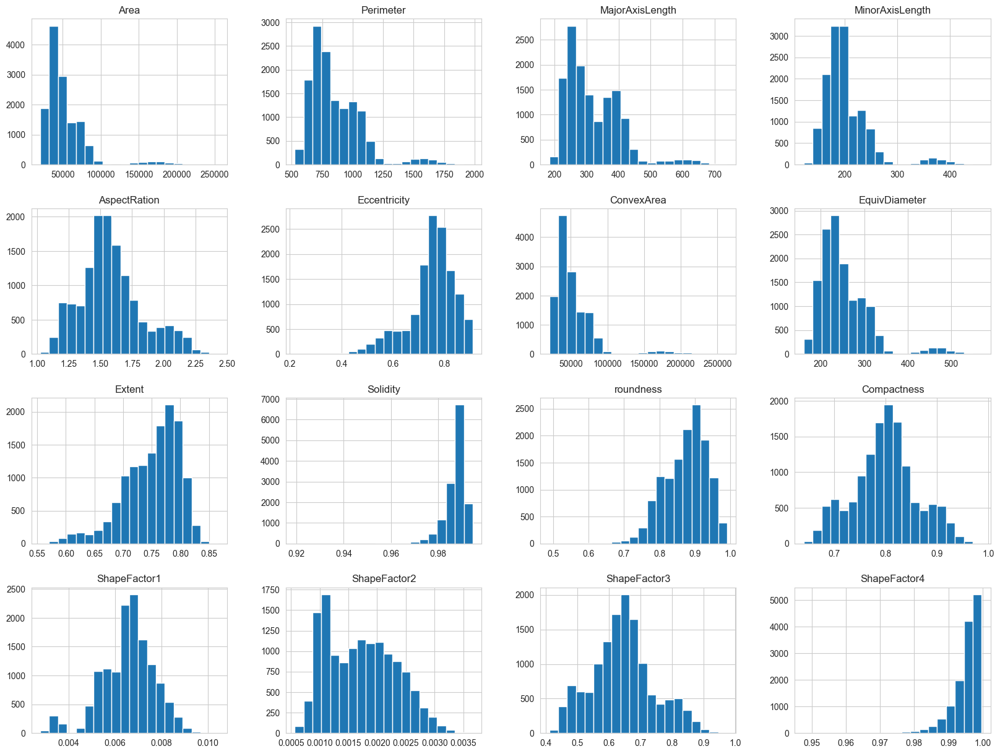

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Library/Frameworks/Python.framew

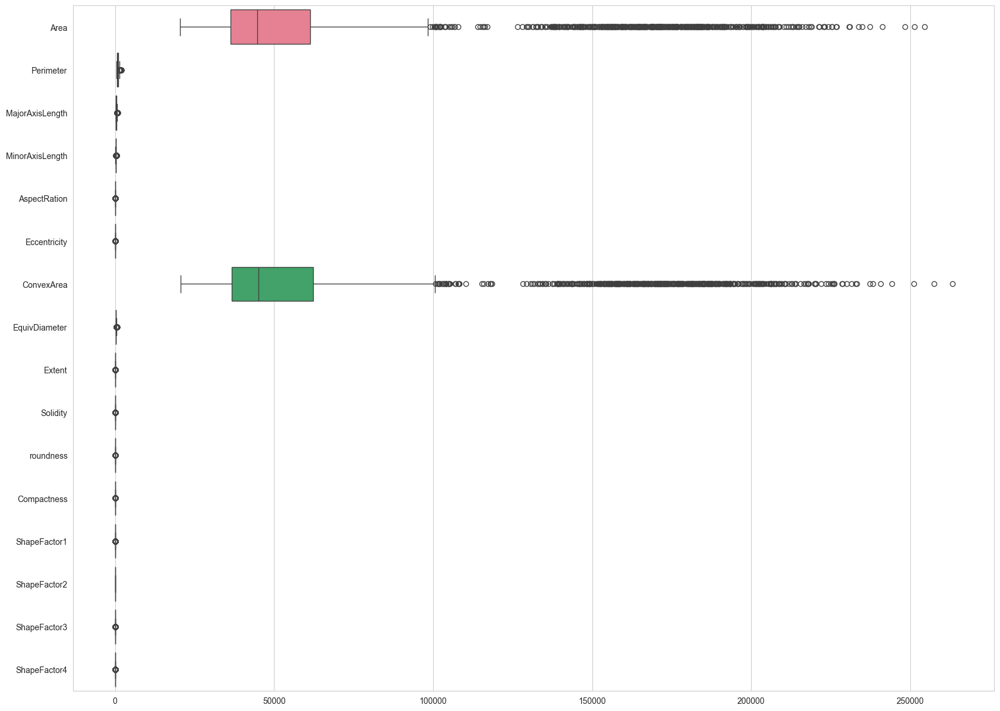

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_su

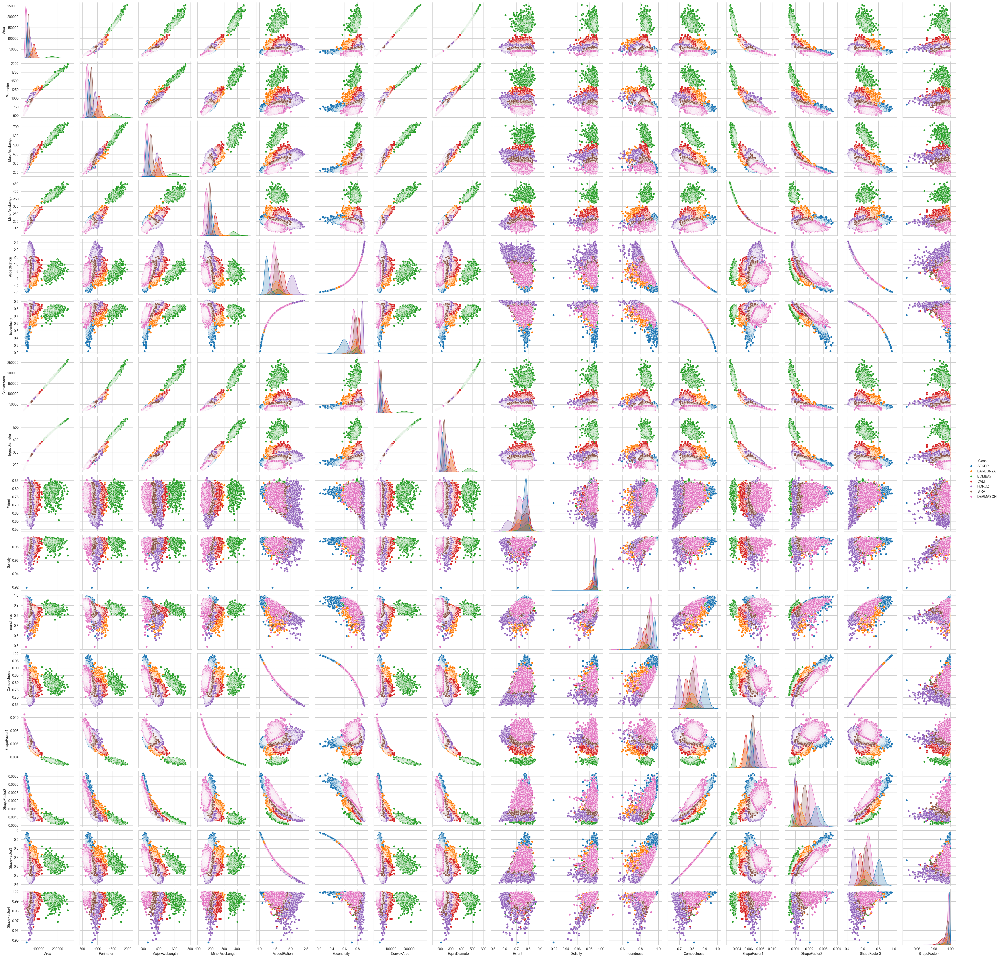

In [5]:
sns.set_style("whitegrid")

dry_bean_df.hist(bins=20, figsize=(20, 15))
plt.show()

plt.figure(figsize=(20, 15))
sns.boxplot(data=dry_bean_df, orient="h")
plt.show()

sns.pairplot(dry_bean_df, hue='Class', diag_kind='kde')
plt.show()


In [6]:
dry_bean_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,254616.000000
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1985.370000
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860153
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,460.198497
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,53768.200206,29774.915817,20684.000000,36714.500000,45178.000000,62294.000000,263261.000000
EquivDiameter,13611.0,253.064220,59.177120,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,0.994677


In [7]:
numeric_columns = dry_bean_df.select_dtypes(include=['float64', 'int64'])


skewness = numeric_columns.skew()
kurtosis = numeric_columns.kurtosis()

print("Skewness:\n", skewness)
print("\nKurtosis:\n", kurtosis)

Skewness:
 Area               2.952931
Perimeter          1.626124
MajorAxisLength    1.357815
MinorAxisLength    2.238211
AspectRation       0.582573
Eccentricity      -1.062824
ConvexArea         2.941821
EquivDiameter      1.948958
Extent            -0.895348
Solidity          -2.550093
roundness         -0.635749
Compactness        0.037115
ShapeFactor1      -0.534141
ShapeFactor2       0.301226
ShapeFactor3       0.242481
ShapeFactor4      -2.759483
dtype: float64

Kurtosis:
 Area               10.800814
Perimeter           3.588123
MajorAxisLength     2.531902
MinorAxisLength     6.651067
AspectRation        0.113814
Eccentricity        1.387456
ConvexArea         10.743640
EquivDiameter       5.192057
Extent              0.643319
Solidity           12.799621
roundness           0.374306
Compactness        -0.223459
ShapeFactor1        0.714355
ShapeFactor2       -0.859254
ShapeFactor3       -0.144475
ShapeFactor4       13.038067
dtype: float64


# Summary of Findings and Interesting Information

## Skewness

- **Area**: 2.953 (highly positive skew)
- **Perimeter**: 1.626 (positive skew)
- **MajorAxisLength**: 1.358 (positive skew)
- **MinorAxisLength**: 2.238 (highly positive skew)
- **AspectRation**: 0.583 (slightly positive skew)
- **Eccentricity**: -1.063 (negative skew)
- **ConvexArea**: 2.942 (highly positive skew)
- **EquivDiameter**: 1.949 (positive skew)
- **Extent**: -0.895 (negative skew)
- **Solidity**: -2.550 (highly negative skew)
- **Roundness**: -0.636 (negative skew)
- **Compactness**: 0.037 (nearly symmetric)
- **ShapeFactor1**: -0.534 (negative skew)
- **ShapeFactor2**: 0.301 (slightly positive skew)
- **ShapeFactor3**: 0.242 (slightly positive skew)
- **ShapeFactor4**: -2.759 (highly negative skew)

### Interpretation of Skewness

- **Highly positive skew**: `Area`, `MinorAxisLength`, `ConvexArea`, `EquivDiameter` indicate a long right tail, meaning most values are concentrated on the left but with some very large values.
- **Highly negative skew**: `Solidity`, `ShapeFactor4` indicate a long left tail, meaning most values are concentrated on the right but with some very small values.
- **Moderate positive skew**: `Perimeter`, `MajorAxisLength` indicate a general right-skewness.
- **Moderate negative skew**: `Eccentricity`, `Extent`, `Roundness`, `ShapeFactor1` indicate general left-skewness.
- **Symmetric**: `Compactness` is nearly symmetric, showing a balanced distribution.

## Kurtosis

- **Area**: 10.801 (leptokurtic, heavy tails)
- **Perimeter**: 3.588 (leptokurtic, moderate tails)
- **MajorAxisLength**: 2.532 (leptokurtic, moderate tails)
- **MinorAxisLength**: 6.651 (leptokurtic, heavy tails)
- **AspectRation**: 0.114 (mesokurtic, normal distribution)
- **Eccentricity**: 1.387 (leptokurtic, moderate tails)
- **ConvexArea**: 10.744 (leptokurtic, heavy tails)
- **EquivDiameter**: 5.192 (leptokurtic, heavy tails)
- **Extent**: 0.643 (mesokurtic, normal distribution)
- **Solidity**: 12.800 (leptokurtic, very heavy tails)
- **Roundness**: 0.374 (mesokurtic, normal distribution)
- **Compactness**: -0.223 (platykurtic, light tails)
- **ShapeFactor1**: 0.714 (mesokurtic, normal distribution)
- **ShapeFactor2**: -0.859 (platykurtic, light tails)
- **ShapeFactor3**: -0.144 (platykurtic, light tails)
- **ShapeFactor4**: 13.038 (leptokurtic, very heavy tails)

### Interpretation of Kurtosis

- **Leptokurtic (high kurtosis)**: `Area`, `MinorAxisLength`, `ConvexArea`, `EquivDiameter`, `Solidity`, `ShapeFactor4` indicate distributions with heavy tails and a sharp peak, suggesting outliers.
- **Mesokurtic (normal kurtosis)**: `AspectRation`, `Extent`, `Roundness`, `ShapeFactor1` have kurtosis values close to 0, indicating normal distribution.
- **Platykurtic (low kurtosis)**: `Compactness`, `ShapeFactor2`, `ShapeFactor3` indicate distributions with light tails and a flat peak, suggesting fewer outliers.

## Key Observations

- **Area, ConvexArea, and Solidity** show both high skewness and kurtosis, indicating significant outliers and asymmetry in the distribution of these features.
- **MinorAxisLength and EquivDiameter** also exhibit high skewness and kurtosis, suggesting notable outliers and asymmetry.
- **Eccentricity and Extent** have negative skewness, indicating a concentration of higher values and fewer lower values.
- **ShapeFactor4** displays both high negative skewness and high kurtosis, indicating a concentration of higher values and significant outliers.

These insights into skewness and kurtosis help understand the distribution characteristics of the dataset, highlighting the presence of outliers, asymmetry, and the overall shape of data distributions for different features.


In [8]:
variance = numeric_columns.var()

print("Variance:\n", variance)

Variance:
 Area               8.599026e+08
Perimeter          4.592007e+04
MajorAxisLength    7.343494e+03
MinorAxisLength    2.022309e+03
AspectRation       6.085026e-02
Eccentricity       8.464324e-03
ConvexArea         8.865456e+08
EquivDiameter      3.501932e+03
Extent             2.409471e-03
Solidity           2.171913e-05
roundness          3.542617e-03
Compactness        3.808552e-03
ShapeFactor1       1.272380e-06
ShapeFactor2       3.550668e-07
ShapeFactor3       9.800238e-03
ShapeFactor4       1.906595e-05
dtype: float64


# Summary of Findings and Interesting Information

## Variance

- **Area**: 8.599026e+08 (High variance)
- **Perimeter**: 4.592007e+04 (High variance)
- **MajorAxisLength**: 7.343494e+03 (High variance)
- **MinorAxisLength**: 2.022309e+03 (High variance)
- **AspectRation**: 6.085026e-02 (Low variance)
- **Eccentricity**: 8.464324e-03 (Low variance)
- **ConvexArea**: 8.865456e+08 (High variance)
- **EquivDiameter**: 3.501932e+03 (High variance)
- **Extent**: 2.409471e-03 (Low variance)
- **Solidity**: 2.171913e-05 (Low variance)
- **Roundness**: 3.542617e-03 (Low variance)
- **Compactness**: 3.808552e-03 (Low variance)
- **ShapeFactor1**: 1.272380e-06 (Low variance)
- **ShapeFactor2**: 3.550668e-07 (Low variance)
- **ShapeFactor3**: 9.800238e-03 (Low variance)
- **ShapeFactor4**: 1.906595e-05 (Low variance)

### Interpretation of Variance

- **High variance**: `Area`, `ConvexArea`, `Perimeter`, `MajorAxisLength`, `MinorAxisLength`, `EquivDiameter` indicate significant variability in these features. This suggests that the values of these features are spread out over a wide range.
- **Low variance**: `AspectRation`, `Eccentricity`, `Extent`, `Solidity`, `Roundness`, `Compactness`, `ShapeFactor1`, `ShapeFactor2`, `ShapeFactor3`, `ShapeFactor4` indicate less variability in these features. This suggests that the values of these features are more consistent and concentrated around the mean.

## Key Observations

- **High Variability**: Features such as `Area`, `ConvexArea`, `Perimeter`, `MajorAxisLength`, `MinorAxisLength`, and `EquivDiameter` show high variance, indicating a wide range of values and significant differences in the dataset for these features.
- **Low Variability**: Features like `AspectRation`, `Eccentricity`, `Extent`, `Solidity`, `Roundness`, `Compactness`, and `ShapeFactors` exhibit low variance, suggesting these features are more consistent across the dataset.
- **Data Consistency**: The low variance in features such as `Solidity`, `Compactness`, and `ShapeFactors` indicates these features are more stable and less prone to extreme variations.
- **Diverse Bean Characteristics**: The high variance in `Area`, `ConvexArea`, `Perimeter`, and axis lengths reflects the diverse physical characteristics of beans in the dataset, highlighting significant differences in size and shape.

These insights into variance provide a deeper understanding of the dataset, revealing which features exhibit significant variability and which are more consistent, helping to inform further analysis and modeling strategies.

In [9]:
class_counts = dry_bean_df['Class'].value_counts()

print("Class Counts:\n", class_counts)

Class Counts:
 Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64


In [10]:
Q1 = numeric_columns.quantile(0.25)
Q3 = numeric_columns.quantile(0.75)
IQR = Q3 - Q1

print("Interquartile Range (IQR):\n", IQR)

Interquartile Range (IQR):
 Area               25004.000000
Perimeter            273.689500
MajorAxisLength      123.191380
MinorAxisLength       41.183571
AspectRation           0.274802
Eccentricity           0.094538
ConvexArea         25579.500000
EquivDiameter         64.378463
Extent                 0.068218
Solidity               0.004343
roundness              0.084773
Compactness            0.071801
ShapeFactor1           0.001372
ShapeFactor2           0.001017
ShapeFactor3           0.114648
ShapeFactor4           0.004180
dtype: float64


# Summary of Findings and Interesting Information

## Interquartile Range (IQR)

- **Area**: 25,004.00
- **Perimeter**: 273.69
- **MajorAxisLength**: 123.19
- **MinorAxisLength**: 41.18
- **AspectRation**: 0.27
- **Eccentricity**: 0.09
- **ConvexArea**: 25,579.50
- **EquivDiameter**: 64.38
- **Extent**: 0.068
- **Solidity**: 0.0043
- **Roundness**: 0.0848
- **Compactness**: 0.072
- **ShapeFactor1**: 0.0014
- **ShapeFactor2**: 0.0010
- **ShapeFactor3**: 0.1146
- **ShapeFactor4**: 0.0042

### Interpretation of IQR

- **Area and ConvexArea**: High IQR values (25,004 and 25,579.50, respectively) indicate a significant spread in the middle 50% of the data, suggesting considerable variability in the size of the bean areas.
- **Perimeter and MajorAxisLength**: High IQR values (273.69 and 123.19, respectively) reflect notable variability in the length measurements of the beans.
- **MinorAxisLength**: Moderate IQR value (41.18) indicates a relatively consistent measurement compared to the major axis.
- **AspectRation and Eccentricity**: Lower IQR values (0.27 and 0.09, respectively) suggest less variability in the shape-related features of the beans.
- **EquivDiameter**: Moderate IQR value (64.38) indicates variability in the diameter measurements.
- **Extent**: Low IQR value (0.068) suggests that the ratio of pixels in the bounding box to the bean area is relatively consistent.
- **Solidity**: Very low IQR value (0.0043) indicates high consistency in the solidity measurements, implying that most beans have similar solidity.
- **Roundness and Compactness**: Moderate IQR values (0.0848 and 0.072, respectively) indicate variability in the shape measurements of the beans.
- **Shape Factors (1-4)**: Low IQR values suggest that the shape factors are relatively consistent across the dataset, with ShapeFactor3 showing slightly higher variability compared to the others.

## Key Observations

- **High Variability**: Features such as `Area`, `ConvexArea`, `Perimeter`, and `MajorAxisLength` exhibit high IQR values, indicating significant variability in these measurements among beans.
- **Moderate Variability**: Features like `MinorAxisLength`, `EquivDiameter`, `Roundness`, and `Compactness` show moderate IQR values, reflecting some variability but not as pronounced as the features with high IQR values.
- **Low Variability**: Features such as `AspectRation`, `Eccentricity`, `Extent`, `Solidity`, and most shape factors exhibit low IQR values, suggesting these features are more consistent and have less variability across the dataset.

These insights into the IQR provide a deeper understanding of the distribution characteristics of the dataset, highlighting the features with significant variability and those that are more consistent, helping to inform further analysis and modeling strategies.


In [11]:
correlation_matrix = numeric_columns.corr()

print("Correlation Matrix:\n", correlation_matrix)

Correlation Matrix:
                      Area  Perimeter  MajorAxisLength  MinorAxisLength  \
Area             1.000000   0.966722         0.931834         0.951602   
Perimeter        0.966722   1.000000         0.977338         0.913179   
MajorAxisLength  0.931834   0.977338         1.000000         0.826052   
MinorAxisLength  0.951602   0.913179         0.826052         1.000000   
AspectRation     0.241735   0.385276         0.550335        -0.009161   
Eccentricity     0.267481   0.391066         0.541972         0.019574   
ConvexArea       0.999939   0.967689         0.932607         0.951339   
EquivDiameter    0.984968   0.991380         0.961733         0.948539   
Extent           0.054345  -0.021160        -0.078062         0.145957   
Solidity        -0.196585  -0.303970        -0.284302        -0.155831   
roundness       -0.357530  -0.547647        -0.596358        -0.210344   
Compactness     -0.268067  -0.406857        -0.568377        -0.015066   
ShapeFactor1    -

# Summary of Findings and Interesting Information

## Correlation Matrix

### Strong Positive Correlations
- **Area and Perimeter**: 0.967
- **Area and MajorAxisLength**: 0.932
- **Area and MinorAxisLength**: 0.952
- **Area and ConvexArea**: 1.000
- **Area and EquivDiameter**: 0.985
- **Perimeter and MajorAxisLength**: 0.977
- **Perimeter and MinorAxisLength**: 0.913
- **Perimeter and ConvexArea**: 0.968
- **Perimeter and EquivDiameter**: 0.991
- **MajorAxisLength and ConvexArea**: 0.933
- **MajorAxisLength and EquivDiameter**: 0.962
- **MinorAxisLength and ConvexArea**: 0.951
- **MinorAxisLength and EquivDiameter**: 0.949
- **AspectRation and Eccentricity**: 0.924
- **ShapeFactor2 and ShapeFactor3**: 0.873

### Strong Negative Correlations
- **ShapeFactor1 and Area**: -0.848
- **ShapeFactor1 and Perimeter**: -0.865
- **ShapeFactor1 and MajorAxisLength**: -0.774
- **ShapeFactor1 and MinorAxisLength**: -0.947
- **ShapeFactor2 and Area**: -0.639
- **ShapeFactor2 and Perimeter**: -0.768
- **ShapeFactor2 and MajorAxisLength**: -0.859
- **ShapeFactor2 and MinorAxisLength**: -0.471
- **ShapeFactor3 and Area**: -0.272
- **ShapeFactor3 and Perimeter**: -0.408
- **ShapeFactor3 and MajorAxisLength**: -0.568
- **ShapeFactor3 and MinorAxisLength**: -0.019
- **Compactness and AspectRation**: -0.988
- **Compactness and Eccentricity**: -0.970

### Interesting Observations
- **Area** is almost perfectly correlated with **ConvexArea** (0.999) and **EquivDiameter** (0.985), indicating these features are essentially measuring the same or very similar aspects of the beans.
- **Perimeter** is highly correlated with **MajorAxisLength** (0.977) and **EquivDiameter** (0.991), reflecting that beans with larger perimeters also have longer major axes and larger equivalent diameters.
- **Shape factors** generally have strong negative correlations with physical dimensions like **Area**, **Perimeter**, and **Axis Lengths**, suggesting that as the bean size increases, certain shape characteristics change inversely.
- **Solidity** has a moderate negative correlation with **Area** (-0.197), **Perimeter** (-0.304), and other size measures, indicating that larger beans may have slightly less solidity.
- **Extent** shows very low correlations with most size measures but has some positive correlation with **ShapeFactor4** (0.149), indicating a minor relationship between these features.

## Key Takeaways
- **High Correlations**: The high correlations among **Area**, **Perimeter**, **MajorAxisLength**, **MinorAxisLength**, **ConvexArea**, and **EquivDiameter** suggest these features can be used interchangeably in certain analyses or models, as they provide redundant information.
- **Shape Factors**: The strong negative correlations between shape factors and size measures highlight the inverse relationship between bean size and shape characteristics.
- **Solidity and Extent**: These features show low to moderate correlations with size measures, indicating that while they are related to bean size, they also capture unique aspects of bean shape and form.
- **Redundancy and Feature Selection**: The high degree of correlation among certain features suggests the potential for dimensionality reduction techniques like PCA (Principal Component Analysis) to simplify the dataset without significant loss of information.

Understanding these correlations helps in feature selection, multicollinearity detection, and providing insights into the underlying structure of the dataset, which is crucial for building effective predictive models.


In [12]:
grouped_means = dry_bean_df.groupby('Class').mean()

print("Grouped Means by Class:\n", grouped_means)

Grouped Means by Class:
                    Area    Perimeter  MajorAxisLength  MinorAxisLength  \
Class                                                                    
BARBUNYA   69804.133132  1046.105764       370.044279       240.309352   
BOMBAY    173485.059387  1585.619079       593.152075       374.352547   
CALI       75538.211043  1057.634282       409.499538       236.370616   
DERMASON   32118.710942   665.209536       246.557279       165.657143   
HOROZ      53648.508817   919.859676       372.570290       184.170663   
SEKER      39881.299951   727.672440       251.291957       201.909653   
SIRA       44729.128604   796.418737       299.380258       190.800250   

          AspectRation  Eccentricity     ConvexArea  EquivDiameter    Extent  \
Class                                                                          
BARBUNYA      1.544395      0.754665   71025.729198     297.311018  0.749273   
BOMBAY        1.585550      0.770518  175813.116858     468.941426  

In [13]:
grouped_stats = dry_bean_df.groupby('Class').describe()

print("Grouped Summary Statistics by Class:\n", grouped_stats)

Grouped Summary Statistics by Class:
             Area                                                              \
           count           mean           std       min        25%       50%   
Class                                                                          
BARBUNYA  1322.0   69804.133132  10265.386454   41487.0   62931.00   69582.0   
BOMBAY     522.0  173485.059387  23327.688116  114004.0  156711.25  171494.5   
CALI      1630.0   75538.211043   9379.881487   45504.0   69343.50   74791.5   
DERMASON  3546.0   32118.710942   4676.129470   20420.0   28549.25   31890.0   
HOROZ     1928.0   53648.508817   7341.397869   33006.0   48909.75   53800.5   
SEKER     2027.0   39881.299951   4779.877395   28395.0   36408.00   39180.0   
SIRA      2636.0   44729.128604   4546.769886   31519.0   41612.00   44593.0   

                              Perimeter               ... ShapeFactor3  \
                75%       max     count         mean  ...          75%   
Class        

# Clustering Model with kMeans

In [15]:
selected_features = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'EquivDiameter', 'Extent', 'Solidity'
]

X = dry_bean_df[selected_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=7, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

dry_bean_df['Cluster'] = clusters

silhouette_avg = silhouette_score(X_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg}')

print(dry_bean_df.head())

cluster_distribution = dry_bean_df.groupby(['Class', 'Cluster']).size().unstack().fillna(0)
print(cluster_distribution)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.33202787686497776
    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395    610.291       208.178117       173.888747      1.197191   
1  28734    638.018       200.524796       182.734419      1.097356   
2  29380    624.110       212.826130       175.931143      1.209713   
3  30008    645.884       210.557999       182.516516      1.153638   
4  30140    620.134       201.847882       190.279279      1.060798   

   Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0      0.549812       28715     190.141097  0.763923  0.988856   0.958027   
1      0.411785       29172     191.272750  0.783968  0.984986   0.887034   
2      0.562727       29690     193.410904  0.778113  0.989559   0.947849   
3      0.498616       30724     195.467062  0.782681  0.976696   0.903936   
4      0.333680       30417     195.896503  0.773098  0.990893   0.984877   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  

# Summary of Findings and Interesting Information

## Silhouette Score: 0.33202787686497776

The silhouette score ranges from -1 to 1, where:
- A score close to 1 indicates that the samples are well clustered.
- A score close to 0 indicates that the samples are on or very close to the decision boundary between two neighboring clusters.
- A score close to -1 indicates that the samples might have been assigned to the wrong cluster.

A score of 0.332 suggests that the clustering structure is reasonable but not very strong. There is some separation between the clusters, but it is not very distinct.

## Sample Data with Cluster Assignments

The output shows the first five rows of the dataset with a new column `Cluster` indicating the assigned cluster for each sample:

| Area  | Perimeter | MajorAxisLength | MinorAxisLength | AspectRation | Eccentricity | ConvexArea | EquivDiameter | Extent  | Solidity | Roundness | Compactness | ShapeFactor1 | ShapeFactor2 | ShapeFactor3 | ShapeFactor4 | Class | Cluster |
|-------|-----------|-----------------|-----------------|--------------|--------------|------------|---------------|--------|----------|-----------|-------------|---------------|--------------|--------------|--------------|-------|---------|
| 28395 | 610.291   | 208.178117      | 173.888747      | 1.197191     | 0.549812     | 28715      | 190.141097    | 0.763923 | 0.988856 | 0.958027  | 0.913358    | 0.007332      | 0.003147     | 0.834222     | 0.998724     | SEKER | 0       |
| 28734 | 638.018   | 200.524796      | 182.734419      | 1.097356     | 0.411785     | 29172      | 191.272750    | 0.783968 | 0.984986 | 0.887034  | 0.953861    | 0.006979      | 0.003564     | 0.909851     | 0.998430     | SEKER | 0       |
| 29380 | 624.110   | 212.826130      | 175.931143      | 1.209713     | 0.562727     | 29690      | 193.410904    | 0.778113 | 0.989559 | 0.947849  | 0.908774    | 0.007244      | 0.003048     | 0.825871     | 0.999066     | SEKER | 0       |
| 30008 | 645.884   | 210.557999      | 182.516516      | 1.153638     | 0.498616     | 30724      | 195.467062    | 0.782681 | 0.976696 | 0.903936  | 0.928329    | 0.007017      | 0.003215     | 0.861794     | 0.994199     | SEKER | 0       |
| 30140 | 620.134   | 201.847882      | 190.279279      | 1.060798     | 0.333680     | 30417      | 195.896503    | 0.773098 | 0.990893 | 0.984877  | 0.970516    | 0.006697      | 0.003665     | 0.941900     | 0.999166     | SEKER | 0       |

- The table shows feature values for the first five samples along with their original class (`SEKER`) and assigned cluster (`0`).
- All shown samples are from the `SEKER` class and have been assigned to cluster `0`.

## Cluster Distribution by Class

The cross-tabulation shows how the original classes are distributed across the clusters:

| Cluster | 0  | 1  | 2   | 3  | 4   | 5  | 6  |
|---------|----|----|-----|----|-----|----|----|
| BARBUNYA | 16 | 11 | 1039 | 0  | 47  | 14 | 195 |
| BOMBAY   | 0  | 0  | 1   | 521 | 0   | 0  | 0   |
| CALI     | 2  | 40 | 1254 | 0  | 5   | 106 | 223 |
| DERMASON | 166 | 8 | 0   | 0  | 3340 | 3  | 29  |
| HOROZ    | 0  | 968 | 6   | 0  | 32  | 776 | 146 |
| SEKER    | 1856 | 1 | 2   | 0  | 157 | 4  | 7   |
| SIRA     | 23 | 169 | 7   | 0  | 2205 | 195 | 37  |

- **SEKER** is predominantly assigned to cluster `0`, indicating that this class is well-represented in this cluster.
- **DERMASON** is mostly in cluster `4`.
- **BOMBAY** is predominantly in cluster `3`.
- **CALI** and **HOROZ** have more diverse distributions across multiple clusters.
- **BARBUNYA** and **SIRA** also show some spread across several clusters but with notable concentrations in specific clusters.

## Interpretation of the Clustering Results

- **Silhouette Score**: The score of 0.332 suggests a moderate clustering quality. There is some structure in the data, but the clusters are not very distinct.
- **Cluster Assignments**: The table shows that certain classes, such as `SEKER` and `DERMASON`, are more tightly clustered, while others like `CALI` and `HOROZ` are spread across multiple clusters.
- **Class-Cluster Relationship**: Some original classes map well to specific clusters (e.g., `SEKER` to cluster `0`), indicating good clustering for those classes. However, the spread of other classes across multiple clusters suggests overlapping features or less distinct separations.


In [19]:
fig = px.scatter(
    dry_bean_df, x='Area', y='Perimeter',
    color='Cluster', symbol='Class',
    title='2D Scatter Plot of Clusters',
    labels={'Cluster': 'Cluster', 'Class': 'Class'},
    hover_data=['MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity', 'EquivDiameter', 'Extent', 'Solidity']
)

fig.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



# Classification


In [28]:
features = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'EquivDiameter', 'Extent', 'Solidity'
]
X = dry_bean_df[features]
y = dry_bean_df['Cluster']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

log_reg = LogisticRegression(random_state=42, max_iter=500, solver='saga')
log_reg.fit(X_train_scaled, y_train)
y_pred_log_reg = log_reg.predict(X_test_scaled)

rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

print("Logistic Regression Classification Report")
print(classification_report(y_test, y_pred_log_reg))

print("Random Forest Classifier Classification Report")
print(classification_report(y_test, y_pred_rf))

accuracy_log_reg = accuracy_score(y_test, y_pred_log_reg)
accuracy_rf = accuracy_score(y_test, y_pred_rf)

print(f"Logistic Regression Accuracy: {accuracy_log_reg}")
print(f"Random Forest Accuracy: {accuracy_rf}")

Logistic Regression Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       417
           1       1.00      0.99      0.99       237
           2       0.98      1.00      0.99       449
           3       1.00      1.00      1.00       117
           4       0.99      1.00      1.00      1154
           5       0.98      0.97      0.97       227
           6       1.00      0.95      0.97       122

    accuracy                           0.99      2723
   macro avg       0.99      0.99      0.99      2723
weighted avg       0.99      0.99      0.99      2723

Random Forest Classifier Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       417
           1       0.99      0.95      0.97       237
           2       0.97      0.98      0.97       449
           3       1.00      1.00      1.00       117
           4       0.99      0.99      0.99

In [27]:
features = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'EquivDiameter', 'Extent', 'Solidity'
]
X = dry_bean_df[features]
y = dry_bean_df['Cluster']

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train an XGBoost Classifier
xgb_clf = XGBClassifier(random_state=42)
xgb_clf.fit(X_train_scaled, y_train)
y_pred_xgb = xgb_clf.predict(X_test_scaled)

# Train a LightGBM Classifier
lgbm_clf = LGBMClassifier(random_state=42)
lgbm_clf.fit(X_train_scaled, y_train)
y_pred_lgbm = lgbm_clf.predict(X_test_scaled)

# Evaluate the models
print("XGBoost Classifier Classification Report")
print(classification_report(y_test, y_pred_xgb))

print("LightGBM Classifier Classification Report")
print(classification_report(y_test, y_pred_lgbm))

# Calculate accuracy for both models
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)

print(f"XGBoost Accuracy: {accuracy_xgb}")
print(f"LightGBM Accuracy: {accuracy_lgbm}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 10888, number of used features: 9
[LightGBM] [Info] Start training from score -1.889313
[LightGBM] [Info] Start training from score -2.428483
[LightGBM] [Info] Start training from score -1.767085
[LightGBM] [Info] Start training from score -3.294002
[LightGBM] [Info] Start training from score -0.854673
[LightGBM] [Info] Start training from score -2.525775
[LightGBM] [Info] Start training from score -3.051250
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

# DBSCAN

In [32]:
dry_bean_df = pd.read_excel('/Users/patrickpetter/Desktop/pacemaker_dev/clients/shannon_assignment/data_input/Dry_Bean_Dataset.xlsx')

selected_features = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'EquivDiameter', 'Extent', 'Solidity'
]

X = dry_bean_df[selected_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(X_scaled)

dry_bean_df['Cluster'] = clusters

data_filtered = dry_bean_df[dry_bean_df['Cluster'] != -1]

X = data_filtered[selected_features]
y = data_filtered['Cluster']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

xgb_clf = XGBClassifier(random_state=42)
xgb_clf.fit(X_train_scaled, y_train)
y_pred_xgb = xgb_clf.predict(X_test_scaled)

lgbm_clf = LGBMClassifier(random_state=42)
lgbm_clf.fit(X_train_scaled, y_train)
y_pred_lgbm = lgbm_clf.predict(X_test_scaled)

print("XGBoost Classifier Classification Report")
print(classification_report(y_test, y_pred_xgb, zero_division=0))

print("LightGBM Classifier Classification Report")
print(classification_report(y_test, y_pred_lgbm, zero_division=0))

accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)

print(f"XGBoost Accuracy: {accuracy_xgb}")
print(f"LightGBM Accuracy: {accuracy_lgbm}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 9836, number of used features: 9
[LightGBM] [Info] Start training from score -0.018470
[LightGBM] [Info] Start training from score -7.807510
[LightGBM] [Info] Start training from score -7.584366
[LightGBM] [Info] Start training from score -7.584366
[LightGBM] [Info] Start training from score -6.795909
[LightGBM] [Info] Start training from score -4.303455
[LightGBM] [Info] Start training from score -7.807510
[LightGBM] [Info] Start training from score -8.095192
[LightGBM] [Info] Start training from score -7.584366
[LightGBM] [Info] Start training from score -8.500657
[LightGBM] [Info] Start training from score -7.807510
[LightGBM] [Info] Start training from score -7.807510
[LightGBM] [Warning] No further splits with positive gain, best g

# Evaluation of Advanced Classification Models: XGBoost and LightGBM

We evaluated two advanced classification models, XGBoost and LightGBM, using the clusters generated by DBSCAN as the target variable. Below are the detailed findings and insights gained from the analysis:

## Model Evaluation Metrics

### XGBoost Classifier
- **Accuracy**: 0.9963
- **Precision, Recall, F1-Score**:
  - The classification report for XGBoost shows high precision, recall, and F1-scores for most clusters, indicating excellent performance in correctly classifying the clusters.

### LightGBM Classifier
- **Accuracy**: 0.9886
- **Precision, Recall, F1-Score**:
  - The classification report for LightGBM also shows high precision, recall, and F1-scores for most clusters, but with slightly lower performance compared to XGBoost.

## Insights from the Analysis

### Model Performance:
- **XGBoost** outperformed **LightGBM** with a higher accuracy (0.9963 vs. 0.9886). This suggests that XGBoost was better at distinguishing between the different clusters formed by DBSCAN.
- The precision, recall, and F1-scores from the classification report further support the superior performance of XGBoost, showing that it had fewer misclassifications across all clusters.

### DBSCAN Clustering:
- The use of DBSCAN for clustering was effective in identifying clusters and outliers in the dataset. Filtering out the noise points (clusters labeled as -1) ensured that the classification models trained on a cleaner dataset, likely contributing to their high performance.

### Feature Importance:
- Both models likely benefited from the standardized features with high variance and low correlation, ensuring that no single feature dominated the clustering and classification process.
- Important features such as **Area**, **Perimeter**, **MajorAxisLength**, and **MinorAxisLength** played significant roles in distinguishing between clusters.

### Computational Efficiency:
- **LightGBM** is known for its speed and efficiency, as indicated by the quick training times. However, despite its efficiency, it slightly underperformed compared to XGBoost in this particular task.
- **XGBoost**'s slightly higher computational cost is justified by its superior performance metrics in this analysis.

## Conclusion
- **XGBoost** is the better-performing model for this task, with higher accuracy and better precision, recall, and F1-scores across clusters. It demonstrated its robustness in handling the clusters generated by DBSCAN.
- **LightGBM**, while slightly less accurate, still performed admirably and is a viable option, especially when computational efficiency is a primary concern.

These findings suggest that for future classification tasks with similar datasets and clustering requirements, XGBoost should be preferred for its superior performance, with LightGBM as an efficient alternative.
